# Insight from Lotka-Volterra Model: How Microplastics Affect Predator-Prey Dynamics


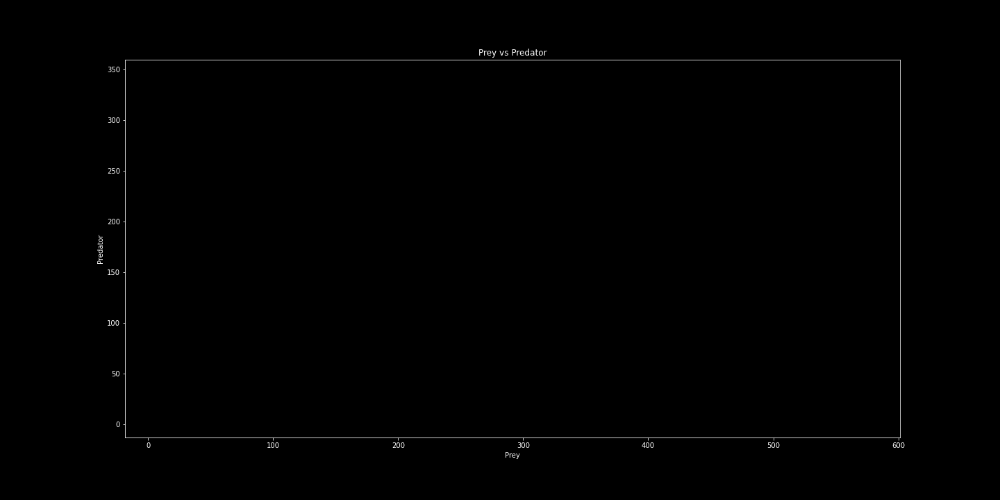

*The gif is just for illustration purposes\
*Source code is at the last cell

The presence of microplastic particles has now become omnipresent in our land and aquatic ecosystems¹⁻³. In fact, these microplastic particles are extremely detrimental to the population dynamics of organisms due to the trophic interactions between them⁴⋅⁵, which refers to the transfer of energy from one organism to another up the food chain. 

One such interaction is bioaccumulation, where the microplastic particles ingested by the prey is then passed along the food chain to the predator. This process elevates environmental toxin levels⁶⋅⁷, and harms the physiological functions of organisms when there is a high concentration of these microplastic particles⁸. Moreover, the diminished feeding capabilities and unusual behaviours of organisms may also further increase the levels of toxicity⁶⋅⁹. In addition, exposure to such microplastic particles can decrease the growth, reproduction and survival rates of aquatic organisms¹⁰⋅¹¹. 

However, despite microplastics particles having such complex implications on the population dynamics of organisms, there is minimal information known about the repercussions microplastic particles have on predator-prey interactions, as well as their population dynamics¹². Therefore, we aim to utilise the Lotka-Volterra predator-prey model to investigate how microplastic particles influence prey and predator population dynamics.

The script would be followed accordingly:


### Table of Contents 
 
* [1.0 Introduction to the Lotka-Volterra Model - A Predator-Prey Model ](#1.0)
    * [1.1 Simulation of Lotka-Volterra Model](#1.1) 
    * [1.2 Plotting Predator and Prey Population against Time](#1.2) 
    * [1.3 Phase Portrait Simulation](#1.3) 
<br /> 
<br /> 
* [2.0 The Predator-Prey Model in the Presence of Microplastics](#2.0) 
    * [2.1 Understanding the Predator-Prey Model under the influence of Microplastic Particles](#2.1) 
    * [2.2 Plotting Predator and Prey population dynamics under microplastic influence](#2.2) 
    * [2.3 Hypothesis](#2.3) 
    * [2.4.0 Simulation of varying Predator and Prey response intensities ratio](#2.4.0) 
    <br /> 
    <br /> 
    
        * [2.4.1 Simulation of varying Predator and reponse intensities ratio in Phase Plots](#2.4.1)
        * [2.4.2 Simulation of varying Predator and reponse intensities ratio, with fixed $r_{21}$](#2.4.2) 
        * [2.4.3 Simulation of varying Predator and reponse intensities ratio, with fixed $r_{11}$](#2.4.3) 
        
    <br /> 
    <br /> 
 
    * [2.5 Small values of response intensities do not affect the population dynamics significantly](#2.5) 
    * [2.6 Predator and Prey Response intensities ratio with ${d_1}$ changed](#2.6) 
    * [2.7 Predator and Prey Response intensities ratio with ${d_2}$ and ${d_3}$ changed](#2.7) 
<br /> 
<br /> 
* [3.0 Conclusion](#3.0) 
<br /> 
<br /> 
* [4.0 Significance/Application](#4.0) 
<br /> 
<br /> 
* [5.0 Future Work](#5.0)
<br /> 
<br /> 
* [6.0 References](#6.0) 

# 1.0 Introduction to the Lotka-Volterra Model <a class="anchor" id="1.0"></a> 

The Lotka Volterra model was originally derived by Alfred J.Lotka to analyse the kinetics of autocatalytic chemical reactions¹³ and was later extended by Vito Volterra to study the dynamics of the predator fish populations¹⁴. 

Over the years, there have been other mathematicians who further extended this model to study the Predator-Prey population dynamics. Studying this model can then build up an appreciation for an interdisciplinary approach into Ecological mathematics in relation to the prey-predator population dynamics. 

The model is explained by these two differential equations: 

\begin{align}
        \begin{array}{cl}
        \frac{dx}{dt} = x(α - βy)
        \end{array}
        \label{eq:dxdt}\tag{1}
    \end{align}

\begin{align}
        \begin{array}{cl}
        \frac{dy}{dt} = y(-σ + γx)
        \end{array}
        \label{eq:dydt}\tag{2}
    \end{align}
    
    
Where x denotes the number of the prey and y the number of the predator.\
α denotes the rate of growth of the prey\
β denotes the rate of reduction of the prey due to being preyed upon by the predator.\
σ denotes the rate of loss of the predator in the environment due to natural causes.\
γ denotes the rate of growth of predator due to feeding upon prey.

We rewrote (1) and (2) into the following form to generate a vector of the 𝑥 and y values:

\begin{align}
        \dot X &= 
        \begin{pmatrix}
        \dot x \\
        \dot y 
        \end{pmatrix} \nonumber \\
        &= \begin{pmatrix}
        x(\alpha - \beta y) \\
        y(-\sigma + \gamma x) 
        \end{pmatrix} \nonumber \\
        &= f(X)
        \label{eq:fX}\tag{3}
    \end{align}

## 1.1 Simulation of Lotka-Volterra model <a class="anchor" id="1.1"></a> 

A simulation of the Lotka-Volterra model is shown here to demonstrate how these differential equations models the population dynamics of the prey and predator in the environment. To simulate this model, we will be using deer and wolves as an example. However, we will be using aquatic predator and prey to simulate the predator-prey model in the presence of microplastics.

In [1]:
# Importing packages for the script
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import string
from scipy.integrate import odeint

In [2]:
# Defining each constant to simulate prey-predator population dynamics under a particular set of conditions

alpha = 1.  # growth rate of prey
beta = 1.   # feeding rate of prey by predator
delta = 1.  # mortality rate of predators
gamma = 1.  # growth of predators due to feeding 
x0 = 4.     # initial value of prey
y0 = 2.     # initial value of predator

#A function containing the two differential equations
def derivative(X, t, alpha, beta, delta, gamma):
    x, y = X
    dotx = x * (alpha - beta * y)
    doty = y * (-delta + gamma * x)
    return np.array([dotx, doty])

### 1.2 Plotting Predator and Prey population against time  <a class="anchor" id="1.2"></a> 

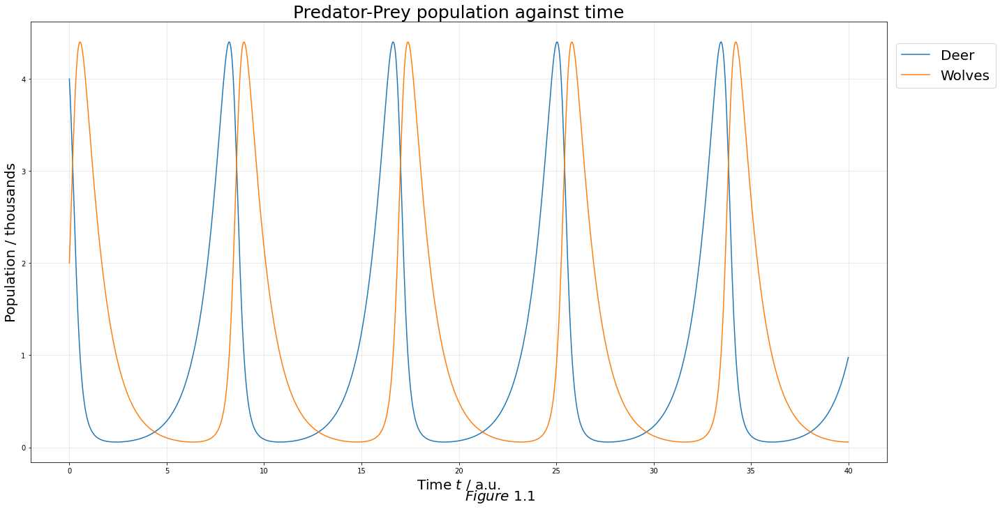

In [3]:
### Plot a typical population time plot using Lotka-Volterra model ###

plt.figure(figsize = (20,10))

# Initial conditions and time steps
Nt = 1000
tmax = 40
t = np.linspace(0,tmax, Nt)
X0 = [x0, y0]

# Integrate.odeint(derivative, X0, t, args) means take derivatives of derivative(), in this case
# an array of 2 differential equations of shape (Nt,2), X0 is initial value of x and y, t is a series of time stpes used to solve the equations 
res = odeint(derivative, X0, t, args = (alpha, beta, delta, gamma))
x, y = res.T

# Plotting the differential equations
plt.plot(t, x,  label = 'Deer')
plt.plot(t, y,  label = "Wolves")

# Labelling
plt.grid(alpha = 0.3)
plt.title("Predator-Prey population against time", size = 25)
plt.xlabel('Time $t$ / a.u.', size = 20)
plt.ylabel('Population / thousands',size = 20)
plt.legend(loc = (1.01, 0.85), fontsize = 20)
plt.figtext(0.5, 0.01, "$Figure$ 1.1", va = 'center_baseline', ha = 'center', fontsize=20)
plt.tight_layout()
plt.show()

Obseving the model and the graph:

\begin{align}
        \begin{array}{cl}
        \frac{dx}{dt} = x(α - βy)
        \end{array}
        \label{eq:dxdt}\tag{1}
    \end{align}

\begin{align}
        \begin{array}{cl}
        \frac{dy}{dt} = y(-σ + γx)
        \end{array}
        \label{eq:dydt}\tag{2}
    \end{align}
\
\
\
At time = 0, the initial conditions indicate that there are 4 thousand deer and 2 thousand wolves. As time passes, the available deer are fed on by the wolves, causing similar fluctuations such that the peaks of the deer population precede the peaks of the wolves population, as shown in the Predator-Prey population against time figure above. 

The rate of change of deer population, $\frac{dx}{dt}$, is described by (1) to be the exponential growth of the deer population, $αx$, subtracted by the product, $βxy$. The deer population is assumed to be exponential as it is assumed that the food supply for the deer is infinite in the environment. The $βxy$ indicates the predation of the prey by predator.

The rate of change of wolf population, $\frac{dy}{dt}$, is described by (2) to be the exponential loss of predators, $σy$,  added to the rate of predators reproducing due the feeding on the prey, $γxy$. The predators are assumed to not have any higher predators preying on them and are lost to the environment due to natural death or migration. As the deer is being fed on by the wolves, the rate of growth of wolves increases, hence the product of the number of deer and wolves to denote $γxy$ .

As the number of deer in the figure has reduced sharply, the number of wolves is also reduced sharply, due to the dependance of wolves population on the deer population, also depicted by (2).  This reduction in the wolves enables the recovery of the deer population, thus causing the deer population to increase. This, in turn, again causes the wolves population to feed on the deer, resuming the cycle of alternating peaks between the predator and prey.

### 1.3 Phase Portrait Simulation <a class="anchor" id="1.3"></a> 

The Phase portrait is an important visualisation tool to analyse the changes in population of prey with respect to the changes in population of predator. Though the predator-prey against time is informative, we are able to better visualise the interaction between the predator and the prey in the environment with the phase portrait. For example, if there is increased prey, this plot is efficent to show the following increase in the predator. Likewise if there is an increase in the prey, the plot is able to reflect the increase in the predator population.

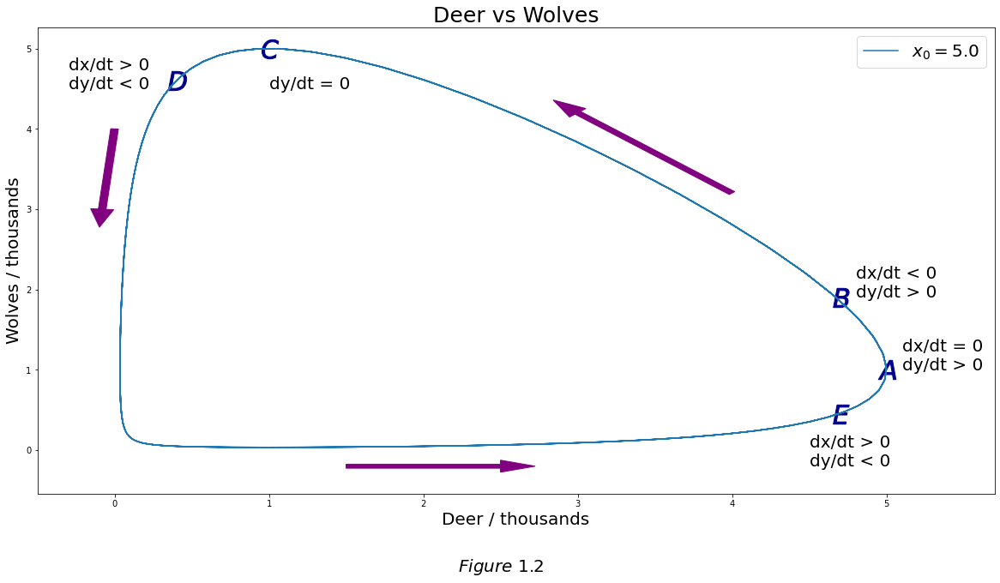

In [4]:
plt.figure(figsize = (20,10))
X0 = [5.0, 1.0]
Xs = odeint(derivative, X0, t, args = (alpha, beta, delta, gamma))
plt.plot(Xs[:,0], Xs[:,1], "-", label = "$x_0 =$"+str(X0[0]))
plt.xlabel("Deer / thousands", size = 20)
plt.ylabel("Wolves / thousands", size =  20)
plt.legend(fontsize = 20)
plt.title("Deer vs Wolves", size = 25)
plt.arrow(4,3.2 ,-1,1,width = 0.05, color = "purple")
plt.arrow(0,4 ,-0.08,-1,width = 0.05, color = "purple")
plt.arrow(1.5, -0.2, 1,0,width = 0.05, color = "purple")
plt.scatter(5,1,marker = "$A$", s = 500, color = "darkblue")
plt.text(x = 5.1, y = 1, s = "dx/dt = 0 \ndy/dt > 0 ", fontsize = 20 )
plt.scatter(4.7,1.9,marker = "$B$", s = 500, color = "darkblue")
plt.text(x = 4.8, y = 1.9, s = "dx/dt < 0 \ndy/dt > 0", fontsize = 20 )
plt.scatter(4.7 ,0.45,marker = "$E$", s = 500, color = "darkblue")
plt.text(x = 4.5, y = -0.2, s = "dx/dt > 0 \ndy/dt < 0", fontsize = 20 )
plt.scatter(1,5,marker = "$C$", s = 500, color = "darkblue")
plt.text(x = 1, y = 4.5, s = "dy/dt = 0", fontsize = 20 )
plt.scatter(0.4,4.6,marker = "$D$", s = 500, color = "darkblue")
plt.text(x = -0.3, y = 4.5, s = "dx/dt > 0 \ndy/dt < 0", fontsize = 20 )
plt.xlim(-0.5 , 5.7)
plt.figtext(0.5, 0.01, "$Figure$ 1.2", va = 'center_baseline', ha = 'center', fontsize=20)
plt.show()


This phase space plot shows the number of wolves against the number of deer for differing initial values of the deer population. The Phase plot is an important visualisation tool to understand the relationship between the prey and predator populations. 

The initial value of the wolf population is kept constant at 1 thousand. 

At the point $(5,1)$ on the blue curve, where $x_0 = 5$ and $y_0 = 1$, 
\
\
$\frac{dx}{dt} = x(α - βy) = 5(1 - 1(1)) = 0$ and 
\
$\frac{dy}{dt} = y(-σ + γx) = 1(-1 + (1)(5)) > 0$. 
\
\
At the turning point, A, ($\frac{dx}{dt} = 0$) indicates that the deer population is maximum, whereas the wolf population is still increasing, ($\frac{dy}{dt} > 0$), which corresponds to the lagging periodic curve as shown in the previous graph.
\
\
At point B, as $\frac{dy}{dt} > 0$, the population of predator increases. Also, since $\frac{dx}{dt} < 0$, the prey population is decreasing. Therefore movement along the blue graph is anticlockwise. The increased predation on the deer population contributes to the wolf population increasing, in turn, causing the deer population to decrease.
\
\
Similarly, at points C, D and E, the predator and prey population evolve according to (1) and (2).

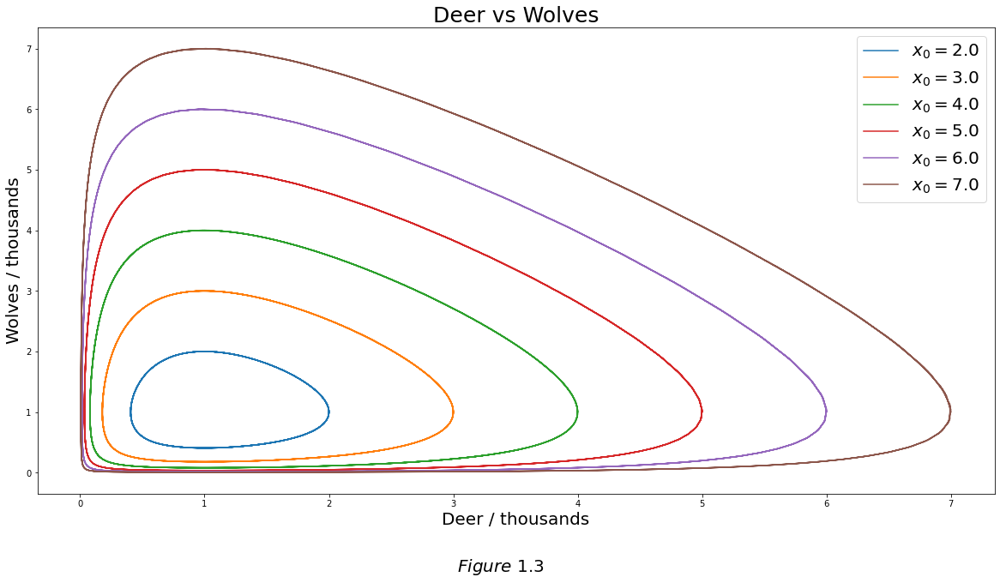

In [5]:
### Phase portrait for different initial number of deer (prey) ###

plt.figure(figsize = (20,10))
IC = np.linspace(2.0, 7.0, 6) # initial conditions for deer population (prey)
for deer in IC:
    X0 = [deer, 1.0]
    Xs = odeint(derivative, X0, t, args = (alpha, beta, delta, gamma))
    plt.plot(Xs[:,0], Xs[:,1], "-", label = "$x_0 =$"+str(X0[0]))
    
# Labelling
plt.xlabel("Deer / thousands", size = 20)
plt.ylabel("Wolves / thousands", size = 20)
plt.legend(fontsize = 20)
plt.title("Deer vs Wolves", size = 25)
plt.figtext(0.5, 0.01, "$Figure$ 1.3", va = 'center_baseline', ha = 'center', fontsize=20)

plt.show()


The above calculations and descriptions from Figure 1.2 can be applied in a similar manner to explain the direction of movement of other curves based on the different $x_0$ values. This shows that the Lotka-Volterra Model is a robust model that simulates different initial conditions well for predator-prey population dynamics.


# 2.0 The Predator-Prey Model in the presence of Microplastics <a class="anchor" id="2.0"></a> 

Huang et al. proposed a model to study the effects of microplastics particles on the population dynamics of predator and prey population. They utilised an altered Lotka-Volterra model that incorporates the original Lotka-Volterra model and a single-species model under the toxicant influence of microplastic particles in an aquatic environment. This model aims to aid researchers in approaching environmental conundrums relating to plastic and persistent organic pollutants. 

The model only focuses on the interactions between a single predator species and a single prey species and also makes the following assumptions for the ease of modelling: 

1. Influence of intraspecies competition is neglected
2. The effect of the microplastic particles is directly proportional to its concentration 
3. The egestion rates ($g_1, g_2$) are independent of the microplastic concentration in the environment 
4. The change in concentration of microplastics in the environment is disregarded and assumed as constant for the ease of this theoretical simulation. 
5. The predator in this aquatic model has no higher predator preying on them.

Microplastic particles either have a negative or neutral effect on the reproduction and survival of organisms. Exposure to these microplastics can reduce the feeding ability of both prey and predator, causing the growth rate of the prey to decline, which is then represented by $d_1$. 

At the same time, predator performance also decreases. Thus we assign the negative effects of the lowered predator performance to $d_2$. 

Since predator performance decreases, less prey is also eaten, hence $d_3$ denotes the amount of prey not eaten by the predator due to reduced performance.

In addition, microplastic particles can also cause other effects on these aquatic organisms, such as oxidative damage and lowered immunity, which we use the variables $r_{11}C_1$ and $r_{21}C_2$ to represent. These two variables describe the toxicological response intensity of the prey and predator respectively and they are parameters that provide insights on the growth rate of the predator and prey when under the influence of microplastic particles. 

Furthermore, the prey and predator may exert selectivity between the microplastic particles. To illustrate, depending on the physical properties of microplastics, such as their sizes or densities, the prey and predator may or may not ingest these microplastics, which will then affect the extent and hence, the effects of toxin build-up in their bodies. Thus, to note the effects of such selectivity, we use $S_1$ and $S_2$ to represent these effects for the prey and predator respectively. 

_Variables that are more self-explanatory will be explained using the equations of the model in the later portions._ 

## 2.1 Understanding the Predator-Prey Model under the influence of Microplastic Particles <a class="anchor" id="2.1"></a> 

When the physiology, feeding capabilites and behaviours of prey and predators are affected by environmental microplastic particles, there is a change in the dynamics of a typical prey-predator model. 

\
\
The model can be shown by these differential equations: 
\
\
\
\begin{equation*}
    \frac{\mathrm d x_1}{\mathrm d t} = x_1
    \left[(r_{10} - d_1)- r_{11} C_1 - (a_1 - d_3) x_2 \right]
    \label{eq:dx1dt}\tag{4}
\end{equation*}

\begin{equation}
    \frac{\mathrm d x_2}{\mathrm d t} = x_2
    \left[-r_{20} - r_{21} C_2 + (a_2 - d_2) x_1 \right]
    \label{eq:dx2dt}\tag{5}
\end{equation} 

\begin{equation}
    \frac{\mathrm d C_1}{\mathrm d t} = S_1 C_E - g_1 
    \label{eq:dC1dt}\tag{6}
\end{equation}

\begin{equation}
    \frac{\mathrm d C_2}{\mathrm d t} = S_2 C_E + k C_1 - g_2 
    \label{eq:dC2dt}\tag{7}
\end{equation}

where $x_1$ and $x_2$ is the population of the prey and the predator respectively. 



The model above is illustrated using two diagrams below.
\
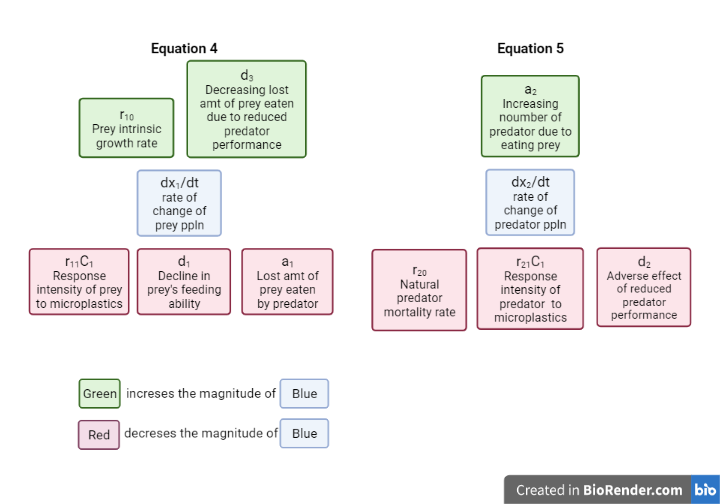

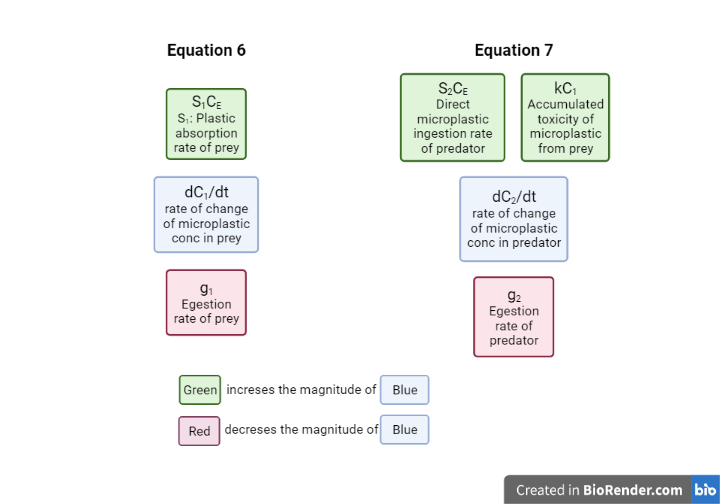

(4): The rate of change of the population of the prey, $\frac{dx_1}{dt}$ is explained in the model to be taking the exponential growth rate of the prey $r_{10}$ and subtracted by the rate of the lowering of the ability of the prey to feed due to changes in behaviour as a result of microplastic toxicity $(d_1)$. This growth rate is further subtracted by the rate of toxicity in the prey that is caused by the microplastics $(r_{11} C_1)$ and the rate of predation of the prey $(a_1 - d_3)x_2$. The subtraction by $d_3$ denotes the reduced feeding of the prey by the predators due to their toxicity and changes in behaviour. 
\
\
(5): The rate of change of the population of the predators, $\frac{dx_2}{dt}$ is explained in the model to be taking the mortality rate of the predator $(r_{20})$ and subtracted by the rate of toxicity in the predator that is caused by the microplastics $(r_{21} C_2)$ and added by the rate of growth of predators by the feeding of the prey $(a_2 - d_2)x_1$. The subtraction by $d_2$ denotes the reduced activity of the predators due to changes in behaviour.
\
\
(6): The rate of change in toxicity in the prey is explained by the absorption rate of toxicants and subtracted by the rate of toxicants exiting the prey body as waste. 
\
\
(7): The rate of change in toxicity in the predator is explained by the absorption rate of toxicants and added to the amount of toxicity that is passed up the food chain as bioaccumulation. This is further subtracted by the rate of toxicants exiting the predator body as waste. 


### Defining Parameters 

We have obtained the parameter values from the published paper by Huang et al. to simulate the population dynamics.

In [6]:
# A function which returns all the parameters + values in a dictionary
def parameters():
    # Parameters
    r_10 = 4.1
    r_20 = 4.0
    d_1 = 0.1
    d_2 = 0.002
    d_3 = 0.002
    a_1 = 0.052
    a_2 = 0.052
    g_1 = 1.2
    g_2 = 1.3
    S_1 = 0.042
    S_2 = 0.039
    k = 2.0
    r_11 = 0.1
    r_21 = 0.1
    C_E = 30.0

    return locals()

parameters_dict = parameters()


# For graphs labelling purpose
abc_lst = string.ascii_lowercase

### Modified Lotka-Volterra differential equations

This function encapsulates the differential equations (4) - (7).

In [7]:
# Function which returns 4 differential equations in np array
def LV_modified(X, t, r_10, r_20, d_1, d_2, d_3, a_1, a_2, g_1, g_2, S_1, S_2, k, r_11, r_21, C_E):  
    
    # constant initial conditions, not meant to be changed
    x_1, x_2, C_1, C_2 = X
    
    # eqn(4)
    dotx_1 = x_1 * ((r_10 - d_1) - (r_11*C_1) - ((a_1 - d_3)*x_2))
    
    # eqn(5)
    dotx_2 = x_2 * (-r_20 - (r_21*C_2) + ((a_2 - d_2)*x_1))
    
    # eqn(6)
    dotC_1 = (S_1*C_E) - g_1
    
    # eqn(7)
    dotC_2 = (S_2*C_E) + (k*C_1) - g_2 
    
    return np.array([dotx_1, dotx_2, dotC_1, dotC_2])





## 2.2 Plotting Predator and Prey population dynamics under Microplastic Influence <a class="anchor" id="2.2"></a> 

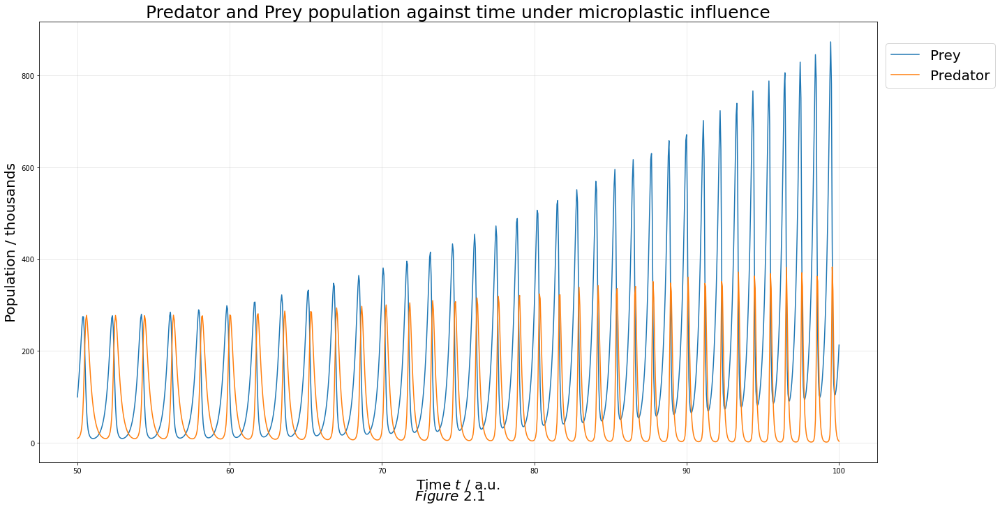

In [8]:
### Predator and Prey have same response intensities to microplastic particles ###

### Setting up initial conditions & time steps ###

# x_1, x_2, C_1, C_2
X0 = [100, 10, 0, 0]   

# Time steps
Nt = 1000
tmax = 100
t = np.linspace(50,tmax, Nt) 

# Solving differential equations using odeint
res = odeint(LV_modified, X0, t, args = tuple(parameters_dict.values()))
x_1, x_2, C_1, C_2 = res.T


# Plotting
plt.figure(figsize = (20, 10))
plt.plot(t, x_1, label = 'Prey')
plt.plot(t, x_2, label = "Predator")

# Labelling
plt.grid(alpha = 0.3)
plt.title("Predator and Prey population against time under microplastic influence", size = 25)
plt.xlabel('Time $t$ / a.u.', size = 20)
plt.ylabel('Population / thousands', size = 20)
plt.legend(loc = (1.01, 0.85), fontsize = 20)
plt.figtext(0.45, 0.01, "$Figure$ 2.1", va = 'center_baseline', ha = 'center', fontsize=20)
# va = vertical alignment
# ha = horizontal alignment

plt.tight_layout()
plt.show()

While experimenting with the same response strengths for predator and prey in the aquatic environment, we discovered that at low microplastic response intensities, the predator population remains roughly the same in the long run. 

As evident from the graph, the predator population seems more vulnerable to microplastics as compared to the prey population. There is a gradual increase in the magnitude of the peaks of the prey population in the long run even though the microplastic response intensities, as denoted by $r_{11}$ for prey and $r_{21}$ for predator are the same. 


This urges us to question how different values of $r_{11}$ and $r_{21}$ can affect the population dynamics of the predator and prey populations.



## 2.3 Hypothesis <a class="anchor" id="2.3"></a> 

1. The predator population is more vulnerable to the effects of microplastic particles as compared to that of the prey population, due to bioaccumulation.
2. At low values of $r_{11}$ and $r_{21}$, where $r_{21}$ and $r_{21}$ are both $<=$ 1.0, their effects on both the prey and predator populations are insignificant. 
3. At low values of $d_1$, $d_2$ and $d_3$, the effects of these variables are negligible. 



### Phase Portrait of Predator and Prey population under microplastic influence

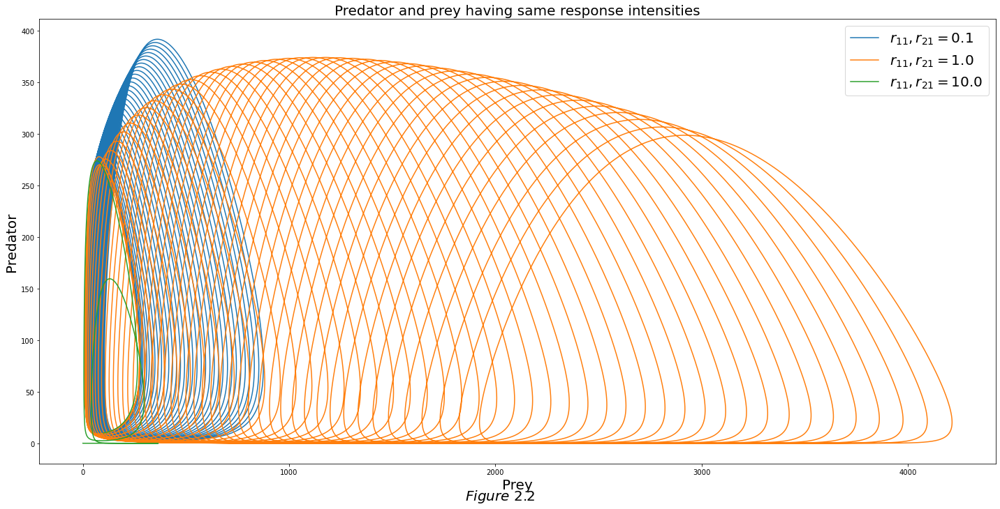

In [9]:
### Phase portrait when prey and predator response strenghts are the same ###
plt.figure(figsize = (20,10))

# Initial conditions & time steps
X0 = [100, 10, 0, 0]
Nt = 100000
tmax = 50
t = np.linspace(0,tmax, Nt)

# Condition for r_11 and r_21
r_s = [0.1, 1.0, 10.0]

# Duplicate the parameters dictionary so that original dictionary will not be changed
para_copy = parameters_dict.copy()

# Solving differential equations & plotting
for r in r_s:
    para_copy['r_11'], para_copy['r_21'] = r, r
    Xs = odeint(LV_modified, X0, t, args = tuple(para_copy.values()))
    plt.plot(Xs[:,0], Xs[:,1], "-", label = "$r_{11}, r_{21} =$"+str(r))
    
# Labelling
plt.xlabel("Prey", fontsize = 20)
plt.ylabel("Predator", fontsize = 20)
plt.legend(fontsize = 20)
plt.title("Predator and prey having same response intensities", size = 20)
plt.figtext(0.5, 0.01, "$Figure$ 2.2", va = 'center_baseline', ha = 'center', fontsize=20)

plt.tight_layout()
plt.show()

From Fig 2.2, when $r_{11}$ = $r_{21}$ = 0.1, there is a slight increase in the predator peaks but a drastic increase in the prey population. When $r_{11}$ = $r_{21}$ = 1.0, there is a gradual decrease in the peaks of the predator population and a drastic increase in the prey population. When $r_{11}$ = $r_{21}$ = 10.0, the population dynamics is too small such that both prey and predator populations become extinct. 

for three different values of $r_{11}$ and $r_{21}$ where their ratios are 1:1, the population dynamics can still vary drastically.

## 2.4.0 Simulation of varying Predator and Prey response intensities ratio <a class="anchor" id="2.4.0"></a> 

For ease of analysis, we can define low microplastic response intensity, $r_{11}$ and $r_{21}$, as less than 0.1. This is because we are able to see a significant change in the population dynamics at $r_{11}$ = $r_{21}$ = 0.1.

C:\Users\emman\Anaconda3\lib\site-packages\scipy\integrate\odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)


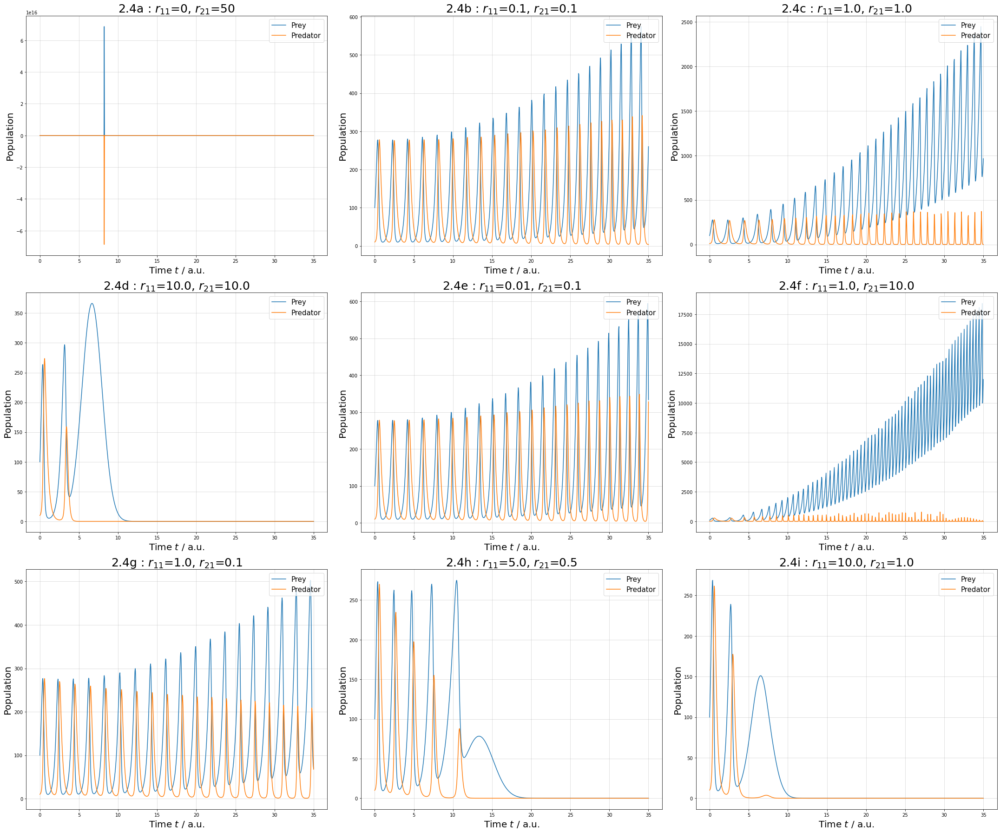

In [10]:
### a: r_11 and r_21 == 0
### b, c, d: r_11 == r_21
### e, f: r_21 is 10 times larger than r_11
### g, h, i: r_11 is 10 times larger than r_21

fig, ax = plt.subplots(ncols = 3, nrows = 3, figsize = (30,25))
ax = ax.flatten() 

# Initial conditions and settings
X0 = [100, 10, 0, 0]
Nt = 1000
tmax = 35
t = np.linspace(0,tmax, Nt)

# Varying r_11 and r_21
r_11_lst = [0, 0.1, 1.0, 10.0, 0.01, 1.0, 1.0, 5.0, 10.0]
r_21_lst = [50, 0.1, 1.0, 10.0, 0.1, 10.0, 0.1, 0.5, 1.0]

para_copy = parameters_dict.copy()

# Making 9 subplots
for count, r in enumerate(r_11_lst):
    para_copy['r_11'], para_copy['r_21'] = r, r_21_lst[count]
    res = odeint(LV_modified, X0, t, args = tuple(para_copy.values()))
    x_1, x_2, C_1, C_2 = res.T #transpose

    # Plotting
    ax[count].plot(t, x_1, label = 'Prey')   
    ax[count].plot(t, x_2, label = 'Predator')
    
    # Labelling
    ax[count].set_xlabel('Time $t$ / a.u.', size = 20)
    ax[count].set_ylabel('Population', size = 20)
    ax[count].legend(loc = 'upper right', fontsize = 15)
    ax[count].grid(alpha = 0.5)
    letter = abc_lst[count]
    ax[count].set_title(f"2.4{letter} : $r_{{11}}$=${para_copy['r_11']}$, $r_{{21}}$={para_copy['r_21']}", size = 25)

plt.tight_layout()
plt.show()

All the plots generally display the typical periodic behaviour of the Lotka-Volterra model, where the peaks of the predator population lag slightly behind the peaks of the prey population. As described in Figure 1.1, as the predator feeds on the prey, the predator population increases, and the prey population declines, which is also seen in Figure 2.4a. The predator population then dips sharply due to the decrease in the availability of food resources (the prey), which then enables the prey population to increase again due to having lower chances of getting preyed on, repeating the cycle. 

However, depending on the $r_{11}$ and $r_{21}$ values, the amplitudes for the graph of both the prey and predator population differ.

For graphs 2.4b and 2.4e, where the values of $r_{11}$ and $r_{21}$ are both considerably low (<= 0.1), they share similar trends where the amplitudes of both the prey and predator graphs show a gradual increase over time, though this increasing trend is larger for the prey population than for the predator population in both graphs. This can be attributed to the bioaccumulation of microplastic particles in the predator population, which reduces predator performance and causes them to be less able to feed on prey to survive. It is likely that the predator population is more vulnerable to the effects of the microplastics compared to the prey population, thus there is a smaller increase in the predator population than the prey population. This then justifies the hypothesis from the analyses done in Figure 2.1.

Meanwhile for graph 2.4c, although $r_{11}$ and $r_{21}$ are still kept relatively low and are both equal to 1.0, the prey population shows a much higher increase in population compared to the predator population. Similar to graph 2.4b where both $r_{11}$ and $r_{21}$ are equal to 0.1, due to the predator population being more vulnerable to the effects of microplastics than the prey population, this causes the amplitude of the predator population to increase only very slightly while that of the prey population increases more over time. 

In graph 2.4d, both the predator and prey populations die out quickly due to the high values of the predator and prey response intensities. When the prey response intensity is very high, there are negative physiological effects that reduce their ability to run from predators. Since preys are easier to catch and also due to the bioaccumulation effect, the predators accumulate huge amounts of microplastics from feeding on the prey. This reduces predator performance and causes the predator population to die out quickly. The high, single peak in the prey population for a brief cycle is probably due to the plummeting of the predator population because there is less predation on the prey. 

In graph 2.4f, where predators’ response intensities are ten times stronger than prey, the amplitude of the prey population graph increases greatly, while the amplitude of the predator population graph remains nearly the same. This observation is nearly the same as in graph 2.4c due to the high vulnerability of predators to microplastics.

For graphs 2.4g, 2.4h and 2.4i, when $r_{11}$ is ten times as much as $r_{21}$, the amplitude of the graphs of the predator populations decrease in the long run, even though the prey response intensity to microplastics is larger than that of the predator. In graph 2.4g, the amplitude of the graph of the predator population decreases slightly, but in graphs 2.4h and 2.4i the predator population decreases to zero. The reason for the predator population decreasing to zero in the long run for graphs 2.4h and 2.4i is due to bioaccumulation and reduced ability of the prey to run away from predators due to negative physiological effects in them. This results in a more pronounced effect of bioaccumulation in predators, negatively impacting their population. As for the prey population, in graph 2.4g, the response intensity of prey is relatively low at 1.0, causing the prey population to still show an overall increase in amplitude. In graphs 2.4d, 2.4h and 2.4i, the response intensities of prey are high, causing the prey population to die out eventually despite the decreasing numbers of predators. There is a peak in graph 2.4d in the prey population for a brief cycle due to the plummeting of the predator population. Again, this shows that even in similar response intensities in prey and predator populations, due to bioaccumulation, the predator dies out first before the prey does due to toxicity.


## 2.4.1 Simulation of varying Predator and reponse intensities ratio in Phase Plots <a class="anchor" id="2.4.1"></a> 

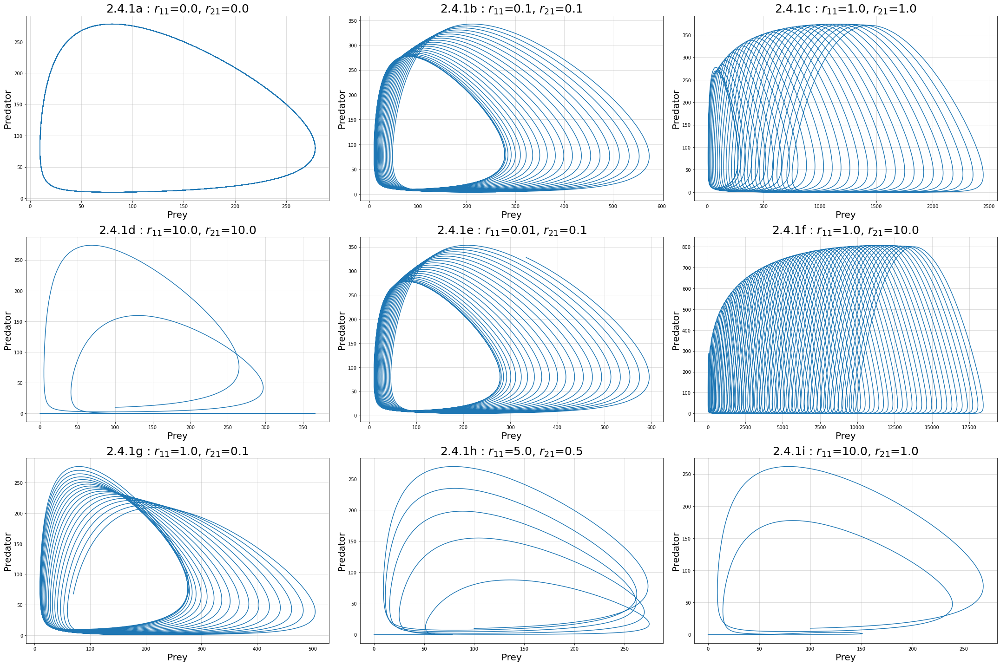

In [11]:
### Phase Portrait for the 9 Plots above ###

fig, ax = plt.subplots(ncols = 3, nrows = 3, figsize = (30,20))

#initial conditions and settings
X0 = [100, 10, 0, 0]
Nt = 100000
tmax = 35
t = np.linspace(0,tmax, Nt)

# Varying r_11 and r_21
r_11_lst = [0.0, 0.1, 1.0, 10.0, 0.01, 1.0, 1.0, 5.0, 10.0]
r_21_lst = [0.0, 0.1, 1.0, 10.0, 0.1, 10.0, 0.1, 0.5, 1.0]
para_copy = parameters_dict.copy()

ax = ax.flatten()

#making 9 subplots
for count in range(9):
    para_copy['r_11'] = r_11_lst[count]
    para_copy['r_21'] = r_21_lst[count]
    Xs = odeint(LV_modified, X0, t, args = tuple(para_copy.values()))
    x_1, x_2, C_1, C_2 = res.T #transpose  
    
    # Plotting
    ax[count].plot(Xs[:,0], Xs[:,1], "-")  
    
    # Labelling
    ax[count].set_xlabel('Prey', size = 20)
    ax[count].set_ylabel('Predator', size = 20)
    ax[count].grid(alpha = 0.5)
    letter = abc_lst[count]
    ax[count].set_title(f"2.4.1{letter} : $r_{{11}}$=${para_copy['r_11']}$, $r_{{21}}$={para_copy['r_21']}", size = 25)
    
plt.tight_layout()
plt.show()

All plots start from Prey = 100, Predator = 10. For Fig 2.4.1a, where prey and predators’ response intensities are zero, the phase portrait resembles the phase portrait of a typical Lotka-Volterra model using equations (1) and (2), meaning that for every value of prey or predator, there are two possible values of predator or prey. However, if microplastics are present in the environment, the phase portraits will be much more complicated and for every one value of prey or predator, there will be more than two values of predator or prey. This indicates the constant decrease in the peaks of either the predator or the prey, thus the phase plots show more than one loop. Out of all plots, only Fig 2.4.1d, h, i eventually become coaxial with the x-axis. These results align with the time plots shown before (Fig 2.4.0), where both predator and prey become ‘extinct’ in the system.

## 2.4.2 Simulation of varying Predator and reponse intensities ratio, with fixed $r_{21}$  <a class="anchor" id="2.4.2"></a> 

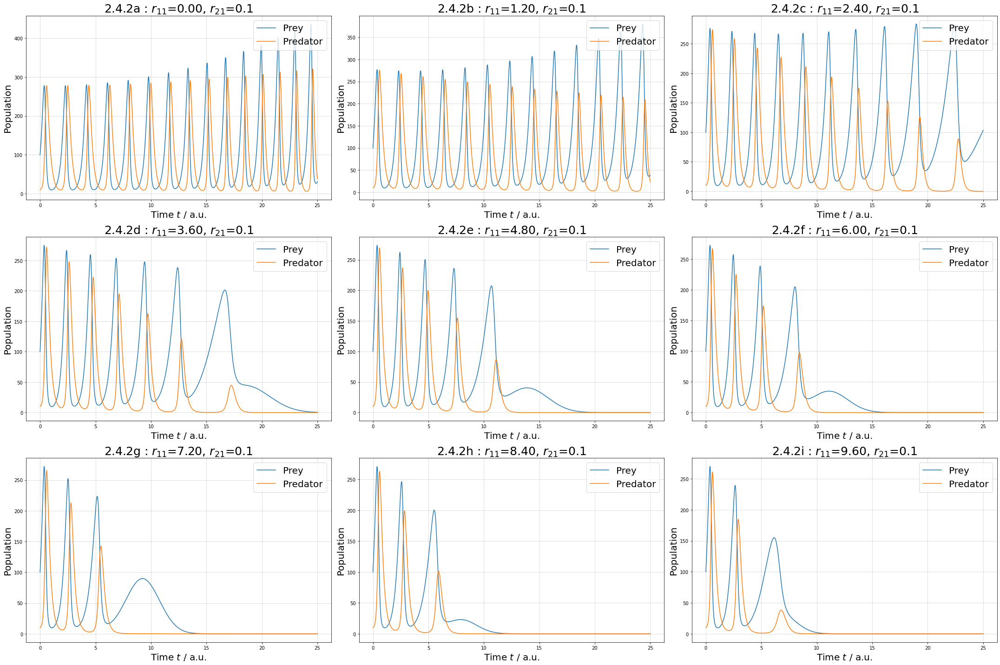

In [12]:
### Plots which r_21 is constant while r_11 is varied ###

fig, ax = plt.subplots(ncols = 3, nrows = 3, figsize = (30,20))
ax = ax.flatten() 

# Initial conditions and settings
X0 = [100, 10, 0, 0]
Nt = 1000
tmax = 25
t = np.linspace(0.,tmax, Nt)

# Varying r_11 and keeping r_21 constant at 0.1
r_11_lst = np.arange(0,10,1.2)
para_copy = parameters_dict.copy()
para_copy['r_21']= 0.1


# Making 9 subplots
for count, r in enumerate(r_11_lst):
    para_copy['r_11']= r_11_lst[count]
    res = odeint(LV_modified, X0, t, args = tuple(para_copy.values()))
    x_1, x_2, C_1, C_2 = res.T #transpose
    
    # Plotting
    ax[count].plot(t, x_1, label = 'Prey')   
    ax[count].plot(t, x_2, label = 'Predator')
    
    # Labelling
    ax[count].set_xlabel('Time $t$ / a.u.', size = 20)
    ax[count].set_ylabel('Population',size = 20)
    ax[count].legend(loc = 'upper right', fontsize = 20)
    ax[count].grid(alpha = 0.5)
    letter = abc_lst[count]
    ax[count].set_title(f"2.4.2{letter} : $r_{{11}}$=${para_copy['r_11']:0.2f}$, $r_{{21}}$={para_copy['r_21']}", size = 25)

plt.tight_layout()
plt.show()


In these plots, $r_{21}$ is fixed at 0.1 and $r_{11}$ is varied from 0.00 to 9.60. As $r_{11}$ increases, we can clearly observe that each graph for the predator population shows an overall larger decrease overall in amplitude than the previous graph. 

For the prey population, the amplitude of the first three graphs ($r_{11}$ = 0.00, 1.20, 2.40) initially show an overall increase, albeit the overall increase in amplitude for each graph is smaller than the previous graph. This observation can be attributed to the increasing prey response intensity, increasingly affecting their physiology and causing their population to increase more slowly. 

Starting from $r_{11}$ = 3.60 onwards, the amplitude for each graph of the prey population shows an overall decrease, with the prey population dying out more quickly than the previous graph and after the predator population dies out. This can be attributed to the increasing and high values of prey response intensity.

This extreme illustration again proves the point that even though the response intensity is higher in the prey population as compared to the predator population, the predators are still affected significantly. The value of $r_{11}$ has a greater effect on both populations than $r_{21}$.


## 2.4.3 Simulation of varying Predator and reponse intensities ratio, with fixed $r_{11}$  <a class="anchor" id="2.4.3"></a> 

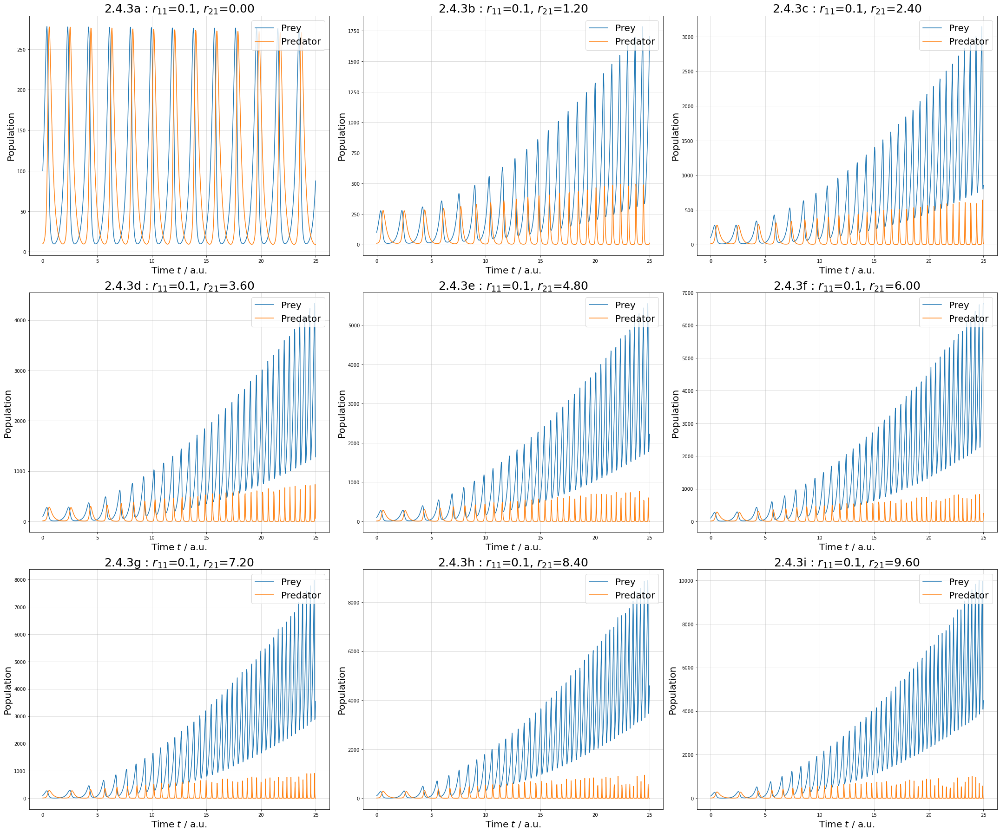

In [13]:
### Plots which r_11 is constant while r_21 is varied ###

fig, ax = plt.subplots(ncols = 3, nrows = 3, figsize = (30,25))
ax = ax.flatten() 

# Initial conditions and settings
X0 = [100, 10, 0, 0]
Nt = 1000
tmax = 25
t = np.linspace(0.,tmax, Nt)

# Keeping r_11 constant at 0.1 while varying r_21
para_copy = parameters_dict.copy()
para_copy['r_11'] = 0.1
r_21_lst = np.arange(0,10,1.2)

# Making 9 subplots
for count, r in enumerate(r_21_lst):
    
    para_copy['r_21']= r_21_lst[count]
    res = odeint(LV_modified, X0, t, args = tuple(para_copy.values()))
    x_1, x_2, C_1, C_2 = res.T #transpose
    
    # Plotting
    ax[count].plot(t, x_1, label = 'Prey')   
    ax[count].plot(t, x_2, label = 'Predator')
    
    # Labelling
    ax[count].set_xlabel('Time $t$ / a.u.', size = 20)
    ax[count].set_ylabel('Population', size = 20)
    ax[count].legend(loc = 'upper right', fontsize = 20)
    ax[count].grid(alpha = 0.5)
    letter = abc_lst[count]
    ax[count].set_title(f"2.4.3{letter} : $r_{{11}}$=${para_copy['r_11']}$, $r_{{21}}$={para_copy['r_21']:0.2f}", size = 25)

plt.tight_layout()
plt.show()

The nine plots show the population dynamics of the prey and predator populations for  a fixed value of $r_{11}$ at 0.1 and varied values of $r_{21}$ from 0.00 to 9.60. 

When $r_{11}$ is low and constant, the amplitude for the graph of prey population increases exponentially while amplitude for the graph of predator population remains about the same. We can deduce from these graphs that since prey do not have strong response intensity towards microplastics, their population increases a lot. On the other hand, for increasing values of $r_{21}$, the predator population still remains about the same. A reason for this observation is the bioaccumulation effect, whereby the concentration of microparticles in predators is much higher than in the prey due to the predators feeding on prey. This is balanced by the increase in the prey population leading to the abundant food source, contributing to the predator population remaining roughly the same while the prey population increases exponentially.

This accounts for the reason why both prey and predator do not die out in the given period of time (will be shown more on the later plots).


## 2.5 Small values of response intensities do not affect the population dynamics significantly <a class="anchor" id="2.5"></a> 

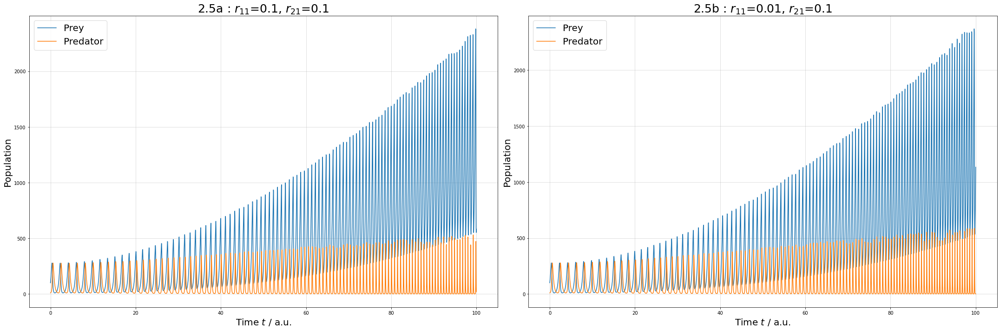

In [14]:
### Plots when r_11 and r_21 are having small values, but over a longer period of time ###

fig, ax = plt.subplots(ncols = 2, nrows = 1, figsize = (30,10))

#initial conditions and settings
para_copy = parameters_dict.copy()
X0 = [100, 10, 0, 0]
Nt = 3000
tmax = 100
t = np.linspace(0,tmax, Nt)

#Small r_11 & r_21 values
r_11_lst = [0.1, 0.01]
r_21_lst = [0.1, 0.1]


ax = ax.flatten()

#making 2 subplots
for count in range(2):
    para_copy['r_11'] = r_11_lst[count]
    para_copy['r_21'] = r_21_lst[count]
    res = odeint(LV_modified, X0, t, tuple(para_copy.values()))
    x_1, x_2, C_1, C_2 = res.T #transpose

    ax[count].plot(t, x_1, label = 'Prey')   
    ax[count].plot(t, x_2, label = 'Predator')
    ax[count].set_xlabel('Time $t$ / a.u.', size = 20)
    ax[count].set_ylabel('Population', size = 20)
    ax[count].legend(loc = 'upper left', fontsize = 20)
    ax[count].grid(alpha = 0.5)
    letter = abc_lst[count]
    ax[count].set_title(f"2.5{letter} : $r_{{11}}$=${para_copy['r_11']}$, $r_{{21}}$={para_copy['r_21']}", size = 25)
    
plt.tight_layout()
plt.show()




These plots were to show two things:

1. Varying the ratio of $r_{11}$ and $r_{21}$ when both of them are small (about 0.1) does not cause much changes to population dynamics.
2. Even if $r_{11}$ and $r_{21}$ are small, the resultant plots still show significant difference with the time plot for typical Lotka-Volterra Model where there is no microplastic in the environment.

In both plots, the amplitudes for the predator population remain almost the same as compared to the amplitudes of the prey population. On the other hand, the amplitude for the prey population increases exponentially for both plots, regardless of the ratio of $r_{11}$ and $r_{21}$. Hence, it shows that at small $r_{11}$ and $r_{21}$ values, the ratio of these values do not contribute to much change in the population dynamics. However, the introduction of microplastic into the environment does cause changes to the population dynamics, as compared to the steady amplitude in the time plot of predator-prey population without microplastics. Thus we can also conclude that even if both prey and predator have low response intensities to microplastics (any values > 0), the microplastic will still affect the population dynamics.

## 2.6 Population of Predator and Prey with ${d_1}$ changed<a class="anchor" id="2.6"></a> 

$d_1$ denotes the reduced feeding capabilities of the prey, $d_2$ denotes the negative effects of reduced predator performance and $d_3$ denotes the amount of prey not eaten by the predator due to the reduced performance 
Plots for d_1 = 0.6, d_2 = 0.012, d_3 = 0.012
Problem will be how to write a main title for all 3 of the plot

Upon simulation of varying $\frac{r_{11}}{r_{21}}$, we observed that the predator population is more vulnerable as compared to prey population despite the similar microplastic response intensities. We can now test if varying feeding capabilities of both prey and predator, as denoted by 𝑑1, 𝑑2 and d3, affect the population dynamics.  

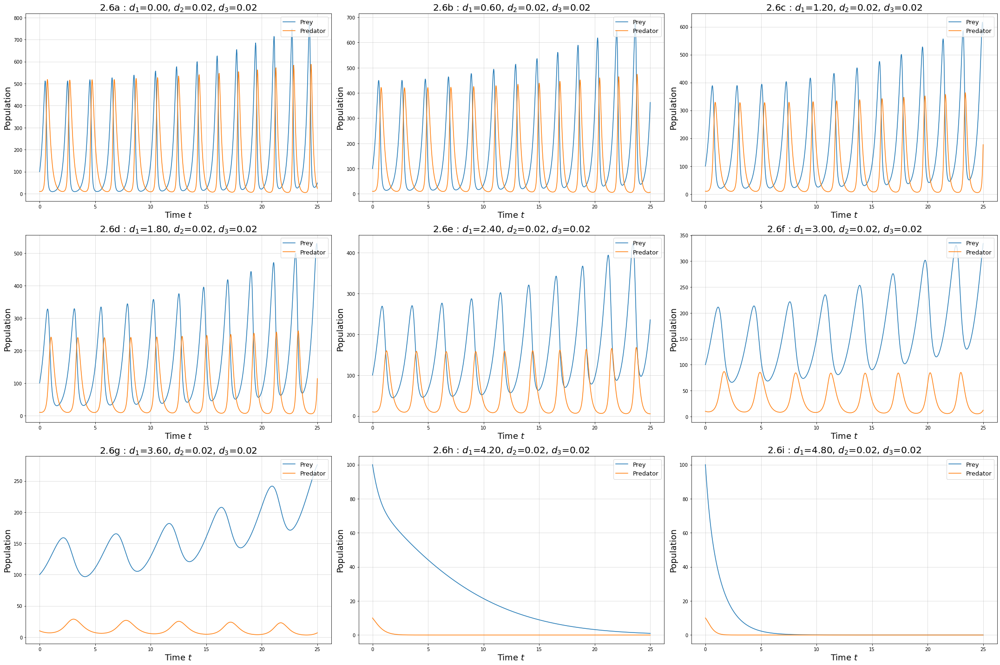

In [15]:
### Plots with varying d_1 and constant d_2 & d_3 at 0.02 ###

fig, ax = plt.subplots(ncols = 3, nrows = 3, figsize = (30,20))
ax = ax.flatten() 

# Initial conditions and settings
X0 = [100, 10, 0, 0]
Nt = 1000
tmax = 25
t = np.linspace(0.,tmax, Nt)

# Varying d_1 and keep d_2 & d_3 constant at 0.02
d_1 = np.arange(0,4.81,0.6)
para_copy = parameters_dict.copy()
para_copy['d_2'] = 0.02
para_copy['d_3'] = 0.02

# r_11 & r_21 == 0.1
r_11, r_21 = parameters_dict['r_11'], parameters_dict['r_21']


# Making 9 subplots
for count,d_value in enumerate(d_1):
    para_copy['d_1'] = d_value
    res = odeint(LV_modified, X0, t, args = tuple(para_copy.values()))
    x_1, x_2, C_1, C_2 = res.T #transpose

    # Plotting
    ax[count].plot(t, x_1, label = 'Prey')   
    ax[count].plot(t, x_2, label = 'Predator')
    
    # Labelling
    ax[count].set_xlabel('Time $t$', fontsize = 18)
    ax[count].set_ylabel('Population', fontsize = 18)
    ax[count].legend(loc = 'upper right', fontsize = 13)
    ax[count].grid(alpha = 0.5)
    letter = abc_lst[count]
    ax[count].set_title(f"2.6{letter} : $d_{{1}}$=${para_copy['d_1']:0.2f}$, $d_{{2}}$=${para_copy['d_2']:0.2f}$, $d_{{3}}$=${para_copy['d_3']}$", fontsize = 20)

plt.tight_layout()
plt.show()


These plots were to show:
When ${d_1}$ increases while ${d_2}$ & ${d_3}$ are kept constant, the amplitude of prey population decreases across different plots.
When ${d_1}$ < ${r_10}$, the amplitude of the prey population always increases (while keeping other parameters constant) within the same plot.

In these plots, ${d_2}$ and ${d_3}$ are kept constant at 0.02 while ${d_1}$ is varied from 0.00 to 4.80. We can observe from the y-axis of these plots that, when ${d_1}$ increases, the amplitudes of the prey population graphs decrease. This implies that as the feeding ability of prey declines, the population of prey decreases. As a result, the predator population also decreases due to reduced food sources. However, starting from ${d_1}$ = 4.20, the prey population quickly descends to extinction (so does the predator population). This is because the effect of the reduced feeding ability of prey outweighs the effect of prey reproduction rate, as shown in equation (4). So, we can reasonably conclude that, provided that the other parameters are kept constant, as long as the prey reproduction rate is larger than its reduced feeding capability, the amplitude for the prey population will always increase.


## 2.7 Population of Predator and Prey with ${d_2}$ and ${d_3}$ changed <a class="anchor" id="2.7"></a> 

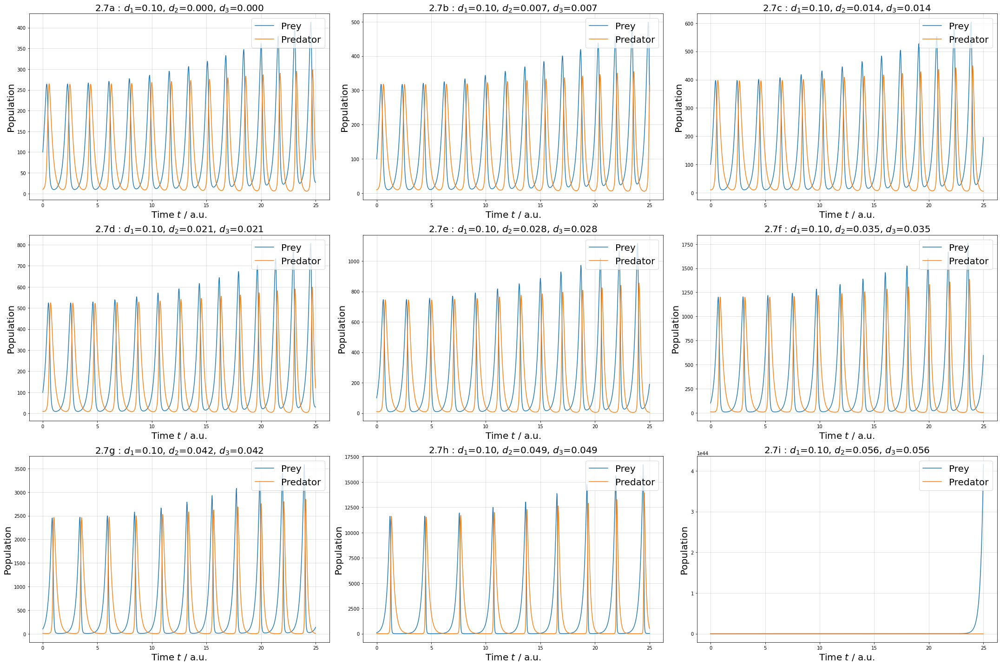

In [16]:
### Plots with varying d_2 & d_3 and constant d_1 at 0.10 ###

fig, ax = plt.subplots(ncols = 3, nrows = 3, figsize = (30,20))
ax = ax.flatten() 

# Initial conditions and settings
X0 = [100, 10, 0, 0]
Nt = 1000
tmax = 25
t = np.linspace(0.,tmax, Nt)

# Varying d_2 & d_3 while keeping d_1 constant at 0.10
d_2 = np.arange(0,0.06,0.007)
para_copy = parameters_dict.copy()
para_copy['d_1'] = 0.1


# Making 9 subplots
for count, d_value in enumerate(d_2):
    
    para_copy['d_2'] = d_value
    para_copy['d_3'] = d_value
    res = odeint(LV_modified, X0, t, args = tuple(para_copy.values()))
    x_1, x_2, C_1, C_2 = res.T #transpose

    # Plotting
    ax[count].plot(t, x_1, label = 'Prey')   
    ax[count].plot(t, x_2, label = 'Predator')
    
    # Labelling
    ax[count].set_xlabel('Time $t$ / a.u.', fontsize = 20)
    ax[count].set_ylabel('Population', fontsize = 20)
    ax[count].legend(loc = 'upper right', fontsize = 20)
    ax[count].grid(alpha = 0.5)
    letter = abc_lst[count]
    ax[count].set_title(f"2.7{letter} : $d_{{1}}$=${para_copy['d_1']:0.2f}$, $d_{{2}}$=${para_copy['d_2']:0.3f}$, $d_{{3}}$=${para_copy['d_3']:0.3f}$", fontsize = 20)

plt.tight_layout()
plt.show()

These plots were to show:

1. As predators’ preying capability decreases, the amplitudes for both prey and predator populations increase.
2. When ${d_2}$ and ${d_3}$ are larger than ${a_2}$ and ${a_3}$, the predator dies out and prey thrives exponentially.
3. Keeping the other parameters constant, the amplitude of the prey population is always larger than the amplitude of the predator population.

In these plots, we assume that ${d_2}$ and ${d_3}$ are always the same value for the ease of modelling. ${d_1}$ is kept constant at 0.10, while ${d_2}$ and ${d_3}$ are varied from 0.000 to 0.056.

As observed, Fig 2.7a to 2.7h still follow the periodic behaviour of the time plot from the pre-modified Lotka-Volterra Model, where the peak of predator population lags slightly behind that of the prey’s.

When ${d_2}$ and ${d_3}$ increases, the amplitude for both prey and predator population increases. This is because when the predator’s performance decreases, more prey survive (thus ${x_1}$ increases). As a result, the predators will have more food due to the increased prey population, which in turn causes an increase in the amplitude of the predator population across the plots. However, if ${d_2}$ and ${d_3}$ are larger than ${a_2}$ and ${a_1}$ as shown in equation (4) and (5), the predator population will die out while the prey population will increase exponentially as shown in Fig 2.7i. This is due to the effect of the reduced predator performance, ${d_3}$, being larger than the lost amount of prey being eaten. However, as the prey population shoots up to a very large value in Fig 2.7i, some details in this plot is hidden.


### Some animaion if you'd like to generate on your own

In [17]:
import matplotlib.animation as animation

In [18]:
# run with caution


# para_copy = parameters_dict.copy()
# plt.style.use('dark_background')
# fig, ax = plt.subplots(figsize = (20,10))

# # Initial conditions and time steps
# tmax = 35
# Nt = 1500
# t = np.linspace(0, tmax, Nt)
# X0 = [100, 10, 0, 0]

# # Solving Differential Equations
# Xs = odeint(LV_modified, X0, t, args = tuple(para_copy.values()))

# # Plotting
# x, y = Xs[:,0], Xs[:,1]
# line, = plt.plot(x, y)

# # Labelling
# ax.set_xlabel("Prey")
# ax.set_ylabel("Predator")
# ax.set_title("Prey vs Predator")


# # Animating
# def animated_plot(frames, x, y, line):

#     line.set_data(x[:frames], y[:frames])
#     return line,

# anim = animation.FuncAnimation(fig, animated_plot, frames = np.arange(1, 1500), blit = True, interval = 5, fargs=[x, y, line])

# # Saving animation as GIF
# f = r'C:\Users\emman\Documents\Spitfire\python_today\test2.gif'
# writergif = animation.PillowWriter(fps=30) 
# anim.save(f, writer=writergif)
 
# plt.show()

# 3.0 Conclusion <a class="anchor" id="3.0"></a> 

Here were our three hypotheses at the start of the paper:

1. The predator population is more vulnerable to the effects of microplastic particles as compared to that of the prey population 
2. At low values of $r_{11}$ and $r_{21}$, where $r_{21}$ and $r_{21}$ are both $<=$ 1.0, their effects on both the prey and predator populations are insignificant. 
3. At low values of $d_1$, $d_2$ and $d_3$, the effects of these variables are negligible. 

From our results and findings, we have justified hypotheses 1 and 3 in the analyses done throughout the Notebook. 

However, from our analyses done in Figure 2.4.2, we have discovered that since $r_{11}$ has a greater effect on both the prey and predator populations and that $r_{11}$ = 1.0 is no longer small enough to only cause insignificant results. Thus a more appropriate conclusion for hypothesis 2 is that at low values of $r_{11}$ and $r_{21}$, where $r_{21}$ $<$ 1.0 and $r_{21}$ $<=$ 1.0, their effects on both the prey and predator populations are insignificant.


# 4.0 Significance / Application  <a class="anchor" id="4.0"></a> 

1. Our model could be used to measure how different Human activities affect the population dynamics of aquatic prey and predator populations. We can study different human actions, such as littering into oceans, and oil or chemical spills from factories and ships, to estimate the values of $r_{11}$, $r_{21}$, ${d_1}$, ${d_2}$ and ${d_3}$, and how these activities affect the values of tho. Afterwards, the simulations of the population dynamics can be done to investigate how these variables affect the population dynamics of the aquatic ecosystem. 

2. Our model can also be used to test whether the environment is polluted. By mapping out the population dynamics of various animal populations in aquatic environments from actual data and comparing them to the population-time graphs we simulated under the influence of microplastics, we can check if a particular environment contains microplastics. We can also vary certain parameters, such as $r_{11}$ and $r_{21}$, according to the different types of pollutants, enabling us to cover specific pollutants that the researcher wants to focus on.

3. Measure how microplastics affect fish business. By using our simulations, we can predict how the population of fish will be affected in the long run by microplastics, and adjust various parameters to suit the new organisms. This can help fishermen to better understand and adapt to future changes in the supply of fish.


# 5.0 Future Work <a class="anchor" id="5.0"></a> 

1. Test on biodegradable plastics
According to Moshood et al. (2022), biodegradable plastic may decompose into carbon dioxide and water under the right conditions: sufficient humidity, oxygen, and some types of microorganisms that can be found in natural landfills or manure15. Some biodegradable plastics, termed ‘bio-plastics’, may not actually biodegrade in certain environments, contributing to pollution in the environment that may mirror the effects of microplastics that we have studied above.  

2. Effect of global warming on population dynamics 
Due to global warming, oceanic temperatures have increased and caused specific animal populations to migrate to other locations to ascertain their survival16. We can then study this animal behaviour and include a new variable for equation (2) since the sigma variable only refers to the rate of loss of predators in the environment due to natural causes and not due to anthropogenic factors. 

3. Vary $C_E$ in the future
In this project, $C_E$, the concentration of microplastics in the environment, was assumed to be constant as this is a theoretical model. However, $C_E$ is affected by environmental factors such as rainfall and wind conditions. We can simulate our model according to different regions with different climate and weather conditions by varying $C_E$ and testing its effect on the population dynamics of aquatic organisms.


# 6.0 References <a class="anchor" id="6.0"></a> 
1. Dawson, A. L. et al. Turning microplastics into nanoplastics through digestive fragmentation by Antarctic krill. Nature communications 9, 1001 (2018).
2. Rochman, C. M. Microplastics research—from sink to source. Science 360, 28–29 (2018).
3. Weithmann, N. et al. Organic fertilizer as a vehicle for the entry of microplastic into the environment. Science Advances 4, eaap8060 (2018).
4. Nelms, S. E., Galloway, T. S., Godley, B. J., Jarvis, D. S. & Lindeque, P. K. Investigating microplastic trophic transfer in marine top predators. Environmental Pollution 238, 999–1007 (2018).
5. Germanov, E. S., Marshall, A. D., Bejder, L., Fossi, M. C. & Loneragan, N. R. Microplastics: no small problem for flter-feeding megafauna. Trends in ecology & evolution 33, 227–232 (2018).
6. Wright, S. L., Tompson, R. C. & Galloway, T. S. Te physical impacts of microplastics on marine organisms: a review. Environmental pollution 178, 483–492 (2013).
7. Browne, M. A. et al. Accumulation of microplastic on shorelines woldwide: sources and sinks. Environmental science & technology 45, 9175–9179 (2011).
8. Browne, M. A., Niven, S. J., Galloway, T. S., Rowland, S. J. & Tompson, R. C. Microplastic moves pollutants and additives to worms, reducing functions linked to health and biodiversity. Current Biology 23, 2388–2392 (2013).
9. Cole, M., Foley, C. J., Feiner, Z. S., Malinich, T. D. & Höök, T. O. A novel method for preparing microplastic fbers. Scientifc reports 6, 34519 (2016).
10. Foley, C. J., Feiner, Z. S., Malinich, T. D. & Höök, T. O. A meta-analysis of the efects of exposure to microplastics on fsh and aquatic invertebrates. Science of the Total Environment 631, 550–559 (2018).
11. do Sul, J. A. I. & Costa, M. F. Te present and future of microplastic pollution in the marine environment. Environmental pollution 185, 352–364 (2014).
12. Eerkes-Medrano, D., Tompson, R. C. & Aldridge, D. C. Microplastics in freshwater systems: a review of the emerging threats, identifcation of knowledge gaps and prioritisation of research needs. Water research 75, 63–82 (2015).
13. Lotka, A. J. Contribution to the theory of periodic reactions. Te Journal of Physical Chemistry 14, 271–274 (1910).
14. (1) Bacaër, N. Lotka, Volterra and the Predator–Prey System (1920–1926). In A Short History of Mathematical Population Dynamics; Bacaër, N., Ed.; Springer: London, 2011; pp 71–76. 
15. Moshood, T. D., Nawanir, G., Mahmud, F., Mohamad, F., Ahmad, M. H., & AbdulGhani, A. (2022). Sustainability of biodegradable plastics: New problem or solution to solve the global plastic pollution? Current Research in Green and Sustainable Chemistry, 5, 100273. https://doi.org/10.1016/j.crgsc.2022.100273 
16. Marine Species on the Move. (n.d.). NEEF. Retrieved April 1, 2022, from https://www.neefusa.org/weather-and-climate/marine-species-move 
